In [1]:
import imgaug as ia
from imgaug import augmenters as iaa
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2 as cv
from itertools import groupby
from collections import namedtuple

In [2]:
# This is needed to display the images.
%matplotlib inline
import matplotlib
matplotlib.rcParams["figure.figsize"] = (9, 7.5)

In [3]:
PATH_TO_ANNO = '../annotations/'
ANNO_TABLE = 'bus_labels.csv'

In [4]:
PATH_TO_IMAGES = '../images/'
PATH_TO_AUG_IMAGES = 'images/'

In [5]:
original_height = 2736
original_width = 3648
#Target height and width
W = 300
H = int(W*(original_height/original_width)) 
y_offset = 37

In [6]:
#New image size
print((H,W))

(225, 300)


In [7]:
df = pd.read_csv(os.path.join(PATH_TO_ANNO, ANNO_TABLE))

In [8]:
df.head(10)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,DSCF1013.JPG,3648,2736,bus,1217,1690,1706,1891
1,DSCF1013.JPG,3648,2736,bus,1774,1619,2249,1843
2,DSCF1013.JPG,3648,2736,bus,2313,1566,2773,1794
3,DSCF1013.JPG,3648,2736,bus,1284,1832,1781,2063
4,DSCF1013.JPG,3648,2736,bus,1879,1798,2365,2026
5,DSCF1013.JPG,3648,2736,bus,2429,1742,2904,1970
6,DSCF1015.JPG,3648,2736,bus,641,1342,1822,2234
7,DSCF1015.JPG,3648,2736,bus,2053,1022,3175,1757
8,DSCF1016.JPG,3648,2736,bus,1067,1843,2181,2456
9,DSCF1016.JPG,3648,2736,bus,1954,1278,2975,1839


In [9]:
# make a list of subgroups, each subgroup is of one file
data = namedtuple('data', ['file', 'object'])
grouped = df.groupby('filename')
gd_data = []
file_naems = []
for file, x in zip(grouped.groups.keys(), grouped.groups):
    gd_data.append(data(file, grouped.get_group(x)))
    file_naems.append(file)

In [10]:
# print examples
gd_data[:3]

[data(file='DSCF1013.JPG', object=       filename  width  height class  xmin  ymin  xmax  ymax
0  DSCF1013.JPG   3648    2736   bus  1217  1690  1706  1891
1  DSCF1013.JPG   3648    2736   bus  1774  1619  2249  1843
2  DSCF1013.JPG   3648    2736   bus  2313  1566  2773  1794
3  DSCF1013.JPG   3648    2736   bus  1284  1832  1781  2063
4  DSCF1013.JPG   3648    2736   bus  1879  1798  2365  2026
5  DSCF1013.JPG   3648    2736   bus  2429  1742  2904  1970),
 data(file='DSCF1015.JPG', object=       filename  width  height class  xmin  ymin  xmax  ymax
6  DSCF1015.JPG   3648    2736   bus   641  1342  1822  2234
7  DSCF1015.JPG   3648    2736   bus  2053  1022  3175  1757),
 data(file='DSCF1016.JPG', object=        filename  width  height class  xmin  ymin  xmax  ymax
8   DSCF1016.JPG   3648    2736   bus  1067  1843  2181  2456
9   DSCF1016.JPG   3648    2736   bus  1954  1278  2975  1839
10  DSCF1016.JPG   3648    2736   bus  2392   717  3356  1352)]

In [11]:
# prepare all images and annotations
filenames = []
original_images = []
original_bboxes = []
for g in gd_data:
    grouped_image = g.object
    
    #create list of bboxes object to each image
    bboxes_on_an_image = []
    for idx, row in grouped_image.iterrows():
        x1 = int(row['xmin']*(W/original_width))
        y1 = int(row['ymin']*(H/original_height))
        x2 = int(row['xmax']*(W/original_width))
        y2 = int(row['ymax']*(H/original_height))
        bboxes_on_an_image.append(ia.BoundingBox(x1, y1, x2, y2))
    original_bboxes.append(ia.BoundingBoxesOnImage(bboxes_on_an_image, shape=(H, W)))
    
    filenames.append(row['filename'])
    
    #open an image
    path = os.path.join(PATH_TO_IMAGES, row['filename'])
    image = cv.imread(path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image = cv.resize(image, (W, H))
    original_images.append(image)

In [12]:
# helpers for bbox drawing
GREEN = [0, 255, 0]
ORANGE = [255, 140, 0]
RED = [255, 0, 0]

def pad(image, by):
    if by <= 0:
        return image
    image_border1 = np.pad(
        image, ((1, 1), (1, 1), (0, 0)),
        mode="constant", constant_values=255
    )
    image_border2 = np.pad(
        image_border1, ((by-1, by-1), (by-1, by-1), (0, 0)),
        mode="constant", constant_values=0
    )

    return image_border2

def draw_bbs(image, bbs, border):
    image_border = pad(image, border)
    for bb in bbs.bounding_boxes:
        if bb.is_fully_within_image(image.shape):
            color = GREEN
        elif bb.is_partly_within_image(image.shape):
            color = ORANGE
        else:
            color = RED
        image_border = bb.shift(left=border, top=border)\
                         .draw_on_image(image_border, thickness=2, color=color)

    return image_border

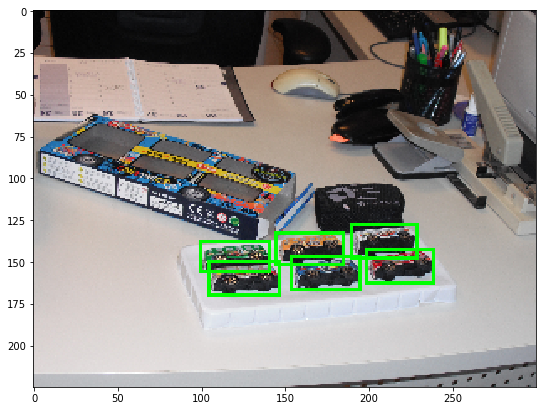

In [13]:
#Show example of a resized image
plt.imshow(draw_bbs(original_images[0], original_bboxes[0], 0))

In [14]:
sometimes = lambda aug: iaa.Sometimes(0.8, aug)
seq = iaa.Sequential([iaa.Multiply(mul=(0.75, 1.25)),
                      iaa.Add(value=(-25,25)),
                      iaa.Fliplr(0.5),
                      iaa.Flipud(0.5),
                      iaa.OneOf([
                          iaa.CoarseDropout((0.0, 0.05), size_percent=(0.02, 0.25)),
                          iaa.AdditiveGaussianNoise(scale=(0, 0.02*255))]),
                      sometimes(iaa.Affine(
                            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
                            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
                            rotate=(-45, 45), # rotate by -45 to +45 degrees
                            shear=(-16, 16), # shear by -16 to +16 degrees
                            order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
                            cval=0, # if mode is constant, use a cval between 0 and 255
                        ))
                     ])
seq_det = seq.to_deterministic() # call this for each batch again, NOT only once at the start

In [15]:
# augment keypoints and images
images_aug = seq_det.augment_images(original_images)
bboxes_aug = seq_det.augment_bounding_boxes(original_bboxes)

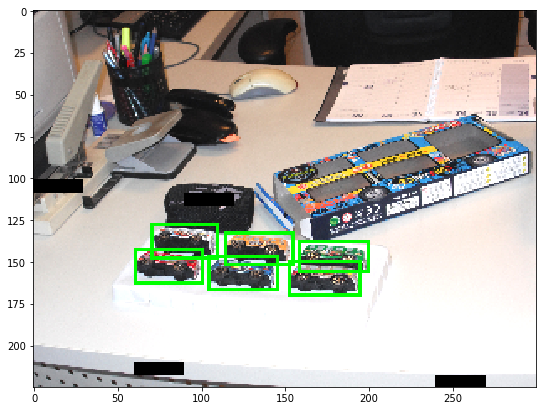

In [16]:
plt.imshow(draw_bbs(images_aug[0], bboxes_aug[0], 0))

In [17]:
#Create a dictionary to store the new annotations
anno_dict = {}
anno_dict['filename'] = []
anno_dict['xmin'] = []
anno_dict['ymin'] = []
anno_dict['xmax'] = []
anno_dict['ymax'] = []

for img_idx, (filename, image_before, image_after, bboxes_before, bboxes_after) in \
        enumerate(zip(filenames, original_images, images_aug, original_bboxes, bboxes_aug)):
    image_before = draw_bbs(image_before, bboxes_before, 0)
    bboxes_after_cut = bboxes_after.remove_out_of_image().cut_out_of_image()
    image_after_cut = draw_bbs(image_after, bboxes_after_cut, 0)

    # Create the dict
    for _, box in enumerate(bboxes_after.bounding_boxes):
        anno_dict['filename'].append(filename)
        anno_dict['xmin'].append(box.x1)
        anno_dict['ymin'].append(box.y1)
        anno_dict['xmax'].append(box.x2)
        anno_dict['ymax'].append(box.y2)

    #plt.figure()
    #plt.imshow(np.concatenate((image_before, image_after_cut), axis=1)) # before and after 

In [18]:
df_aug_anno = pd.DataFrame(anno_dict)

In [19]:
df_aug_anno.head(4)

,filename,xmax,xmin,ymax,ymin
0,DSCF1013.JPG,199,159,155,138
1,DSCF1013.JPG,154,115,151,133
2,DSCF1013.JPG,109,71,147,128
3,DSCF1013.JPG,194,153,169,150


In [20]:
format = lambda y: y+y_offset
df_aug_anno[['ymax','ymin']] = df_aug_anno[['ymax','ymin']].applymap(format)

In [21]:
df_aug_anno.head(4)

,filename,xmax,xmin,ymax,ymin
0,DSCF1013.JPG,199,159,192,175
1,DSCF1013.JPG,154,115,188,170
2,DSCF1013.JPG,109,71,184,165
3,DSCF1013.JPG,194,153,206,187


In [22]:
df_aug_anno = df_aug_anno[['xmin','ymin','xmax','ymax']]

In [23]:
df_aug_anno.insert(0, 'class', 'bus')
df_aug_anno.insert(0, 'height', H+(W-H))
df_aug_anno.insert(0, 'width', W)
df_aug_anno.insert(0, 'filename', 'aug_' + df['filename'])

In [24]:
df_aug_anno.head(8)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,aug_DSCF1013.JPG,300,300,bus,159,175,199,192
1,aug_DSCF1013.JPG,300,300,bus,115,170,154,188
2,aug_DSCF1013.JPG,300,300,bus,71,165,109,184
3,aug_DSCF1013.JPG,300,300,bus,153,187,194,206
4,aug_DSCF1013.JPG,300,300,bus,105,184,145,203
5,aug_DSCF1013.JPG,300,300,bus,61,180,100,199
6,aug_DSCF1015.JPG,300,300,bus,98,142,193,245
7,aug_DSCF1015.JPG,300,300,bus,4,175,93,266


In [25]:
#Write df to csv
df_aug_anno.to_csv(os.path.join(PATH_TO_ANNO, 'aug_' + ANNO_TABLE), index=False)

In [26]:
#write augmented images to disk
for i, (filename, image_after) in enumerate(zip(filenames, images_aug)):
    temp = cv.copyMakeBorder(image_after,37,38,0,0,cv.BORDER_CONSTANT)
    temp = cv.cvtColor(temp, cv.COLOR_BGR2RGB)
    file = os.path.join(PATH_TO_AUG_IMAGES, 'aug_' + filename)
    cv.imwrite(file, temp)

In [27]:
df_aug_anno.head(6)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,aug_DSCF1013.JPG,300,300,bus,159,175,199,192
1,aug_DSCF1013.JPG,300,300,bus,115,170,154,188
2,aug_DSCF1013.JPG,300,300,bus,71,165,109,184
3,aug_DSCF1013.JPG,300,300,bus,153,187,194,206
4,aug_DSCF1013.JPG,300,300,bus,105,184,145,203
5,aug_DSCF1013.JPG,300,300,bus,61,180,100,199


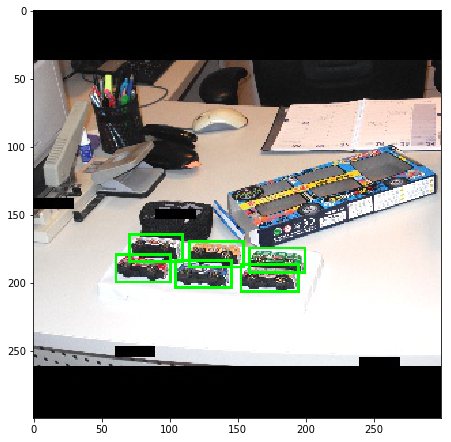

In [28]:
# test
im_test = cv.imread(os.path.join(PATH_TO_AUG_IMAGES, 'DSCF1013.JPG'))
im_test = cv.cvtColor(im_test, cv.COLOR_BGR2RGB)

  
#create list of bboxes object to each image
bboxes_on_an_image = []
for idx, row in df_aug_anno.head(6).iterrows():
        x1 = int(row['xmin'])
        y1 = int(row['ymin'])
        x2 = int(row['xmax'])
        y2 = int(row['ymax'])
        bboxes_on_an_image.append(ia.BoundingBox(x1, y1, x2, y2))
bbox_test = ia.BoundingBoxesOnImage(bboxes_on_an_image, shape=(300, 300))

plt.imshow(draw_bbs(im_test, bbox_test, 0))

In [29]:
from preprocess_images import imshow_bbox, get_images_bboxes

In [30]:
#imshow_bbox(images_aug, bboxes_aug)

In [31]:
csv_test = os.path.join(PATH_TO_ANNO, 'aug_' + ANNO_TABLE)
df_test = df_aug_anno.copy()

In [34]:
[filenames_t, images_t, bboxes_t] = get_images_bboxes(df=df_test, path_to_images=csv_test)

           filename  width  height class  xmin  ymin  xmax  ymax
0  aug_DSCF1013.JPG    300     300   bus   159   175   199   192
1  aug_DSCF1013.JPG    300     300   bus   115   170   154   188
2  aug_DSCF1013.JPG    300     300   bus    71   165   109   184
3  aug_DSCF1013.JPG    300     300   bus   153   187   194   206
4  aug_DSCF1013.JPG    300     300   bus   105   184   145   203
5  aug_DSCF1013.JPG    300     300   bus    61   180   100   199
aug_DSCF1013.JPG
images/aug_DSCF1013.JPG
           filename  width  height class  xmin  ymin  xmax  ymax
6  aug_DSCF1015.JPG    300     300   bus    98   142   193   245
7  aug_DSCF1015.JPG    300     300   bus     4   175    93   266
aug_DSCF1015.JPG
images/aug_DSCF1015.JPG
            filename  width  height class  xmin  ymin  xmax  ymax
8   aug_DSCF1016.JPG    300     300   bus   128   133   235   223
9   aug_DSCF1016.JPG    300     300   bus   141    61   239   144
10  aug_DSCF1016.JPG    300     300   bus   127    10   227    95
aug_

70  aug_DSCF1094.JPG    300     300   bus    94   134   188   197
aug_DSCF1094.JPG
images/aug_DSCF1094.JPG
            filename  width  height class  xmin  ymin  xmax  ymax
71  aug_DSCF1097.JPG    300     300   bus    39    38   162   128
aug_DSCF1097.JPG
images/aug_DSCF1097.JPG
            filename  width  height class  xmin  ymin  xmax  ymax
72  aug_DSCF1099.JPG    300     300   bus   136   116   222   180
aug_DSCF1099.JPG
images/aug_DSCF1099.JPG
            filename  width  height class  xmin  ymin  xmax  ymax
73  aug_DSCF1101.JPG    300     300   bus   154   126   231   205
aug_DSCF1101.JPG
images/aug_DSCF1101.JPG
            filename  width  height class  xmin  ymin  xmax  ymax
74  aug_DSCF1103.JPG    300     300   bus   187   169   244   218
75  aug_DSCF1103.JPG    300     300   bus   132    47   204   113
aug_DSCF1103.JPG
images/aug_DSCF1103.JPG
            filename  width  height class  xmin  ymin  xmax  ymax
76  aug_DSCF1104.JPG    300     300   bus   134   146   198   206
77 

c:\program files (x86)\python36-32\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


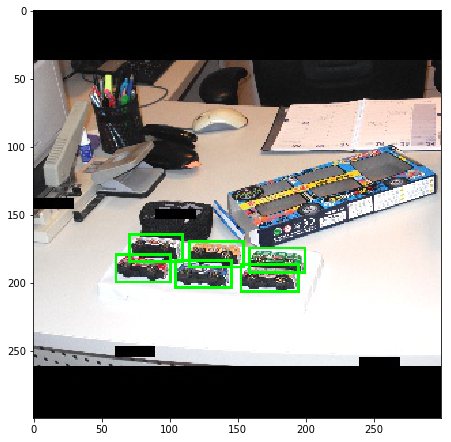

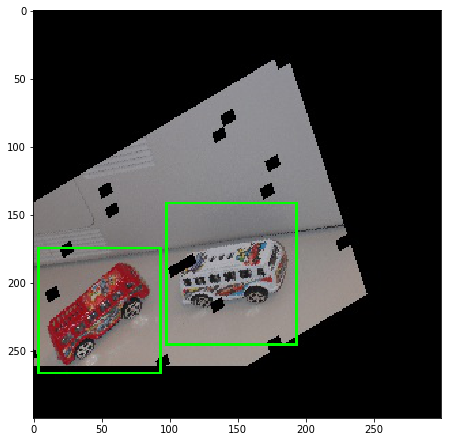

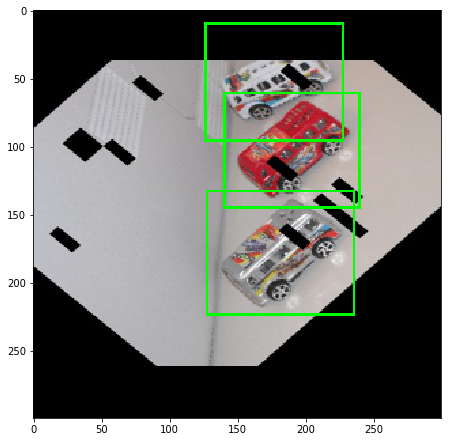

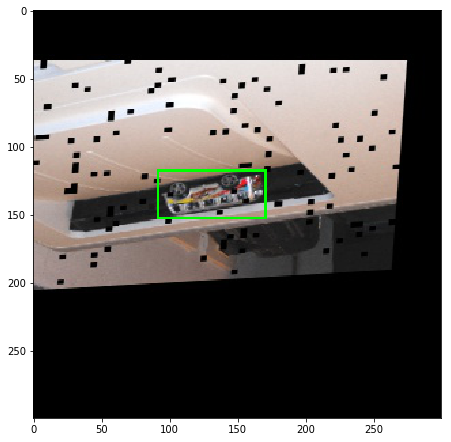

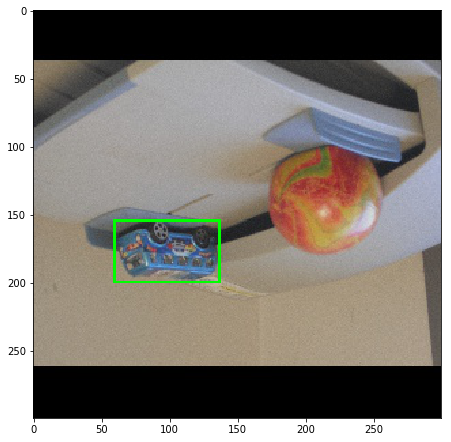

...

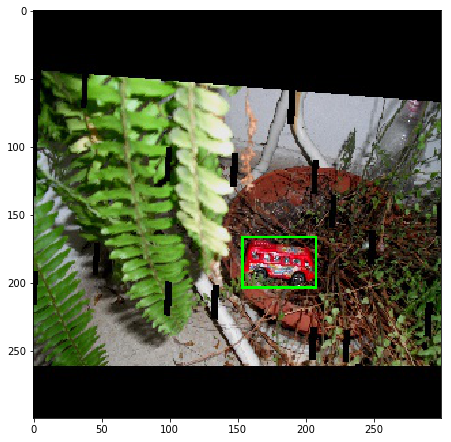

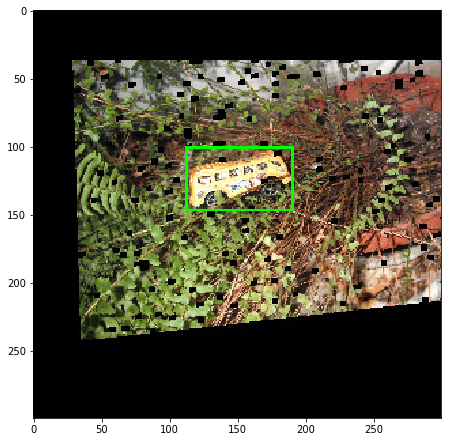

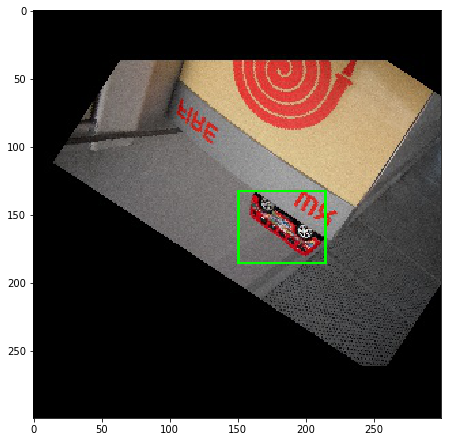

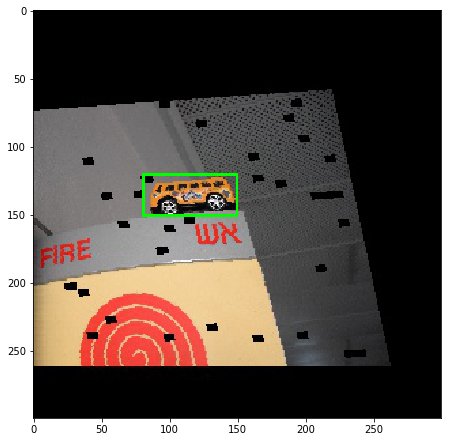

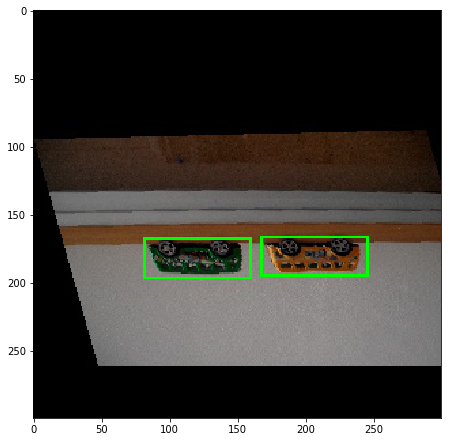

In [35]:
imshow_bbox(images_t, bboxes_t)